# Topic Modeling - Corona Virus #

Taking datasets from Corona Tweet Pull, we'll look to determine which type of topic analysis works best. 

In [224]:
import pandas as pd
import numpy as np

data_1 = pd.read_csv('02122020coronatweets.csv')
data_2 = pd.read_csv('02132020coronatweets.csv')

data_1.dtypes


Unnamed: 0         object
tweet              object
date               object
coordinates        object
place              object
favorite count    float64
retweet count      object
user data          object
dtype: object

In [225]:
data_2.dtypes

Unnamed: 0         int64
tweet             object
date              object
coordinates       object
place             object
favorite count     int64
retweet count      int64
user data         object
dtype: object

In [226]:
data_1['tweet'] = data_1['tweet'].astype(str)
data_1['date'] = data_1['date'].astype('datetime64[ns]')
data_1.dtypes

Unnamed: 0                object
tweet                     object
date              datetime64[ns]
coordinates               object
place                     object
favorite count           float64
retweet count             object
user data                 object
dtype: object

In [227]:
data_2['tweet'] = data_2['tweet'].astype(str)
data_2['date'] = data_2['date'].astype('datetime64[ns]')
data_2.dtypes

Unnamed: 0                 int64
tweet                     object
date              datetime64[ns]
coordinates               object
place                     object
favorite count             int64
retweet count              int64
user data                 object
dtype: object

In [228]:
data_1.head(5)

,Unnamed: 0,tweet,date,coordinates,place,favorite count,retweet count,user data
0,0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,NaN,NaN,0.0,0,User(_api=<tweepy.api.API object at 0x0000022C...
1,1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,NaN,NaN,0.0,0,User(_api=<tweepy.api.API object at 0x0000022C...
2,2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,NaN,NaN,0.0,0,User(_api=<tweepy.api.API object at 0x0000022C...
3,3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,NaN,NaN,0.0,0,User(_api=<tweepy.api.API object at 0x0000022C...
4,4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,NaN,NaN,0.0,0,User(_api=<tweepy.api.API object at 0x0000022C...


In [229]:
data_1 = data_1[['tweet','date', 'user data']]
data_2 = data_2[['tweet','date', 'user data']]
frames = [data_1, data_2]
full_data = pd.concat(frames)

full_data.head(5)

,tweet,date,user data
0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,User(_api=<tweepy.api.API object at 0x0000022C...
1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,User(_api=<tweepy.api.API object at 0x0000022C...
2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,User(_api=<tweepy.api.API object at 0x0000022C...
3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...
4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...


Split User Data to determine User Name and Location

In [230]:
full_data = full_data.rename(columns={"tweet":"tweet", "date":"date", "user data":"userdata"})
full_data.head(5)

,tweet,date,userdata
0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,User(_api=<tweepy.api.API object at 0x0000022C...
1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,User(_api=<tweepy.api.API object at 0x0000022C...
2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,User(_api=<tweepy.api.API object at 0x0000022C...
3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...
4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...


Clean up Userdata for location and screen name

In [231]:
full_data['A'], full_data['B'] = full_data['userdata'].str.split('screen_name', 1).str
full_data = full_data.drop(['A'], axis=1)
full_data['screenname'], full_data['B'] = full_data['B'].str.split('location', 1).str
full_data['location'], full_data['D'] = full_data['B'].str.split('description', 1).str
full_data = full_data.drop(['B','D'], axis=1)
full_data['A'], full_data['B'] = full_data['userdata'].str.split('id', 1).str
full_data['userid'], full_data['D'] = full_data['B'].str.split('id_str', 1).str
full_data = full_data.drop(['B','D', 'A'], axis=1)
full_data['screenname'] = full_data['screenname'].str.replace("': '", '')
full_data['screenname'] = full_data['screenname'].str.replace("', '", '')
full_data['location'] = full_data['location'].str.replace("': '", '')
full_data['location'] = full_data['location'].str.replace("', '", '')
full_data['userid'] = full_data['userid'].str.replace("':", '')
full_data['userid'] = full_data['userid'].str.replace(", '", '')
full_data['userid'] = full_data['userid'].astype(str)
full_data.head()

,tweet,date,userdata,screenname,location,userid
0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,User(_api=<tweepy.api.API object at 0x0000022C...,mikokosuke,,1227173512177057798
1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,User(_api=<tweepy.api.API object at 0x0000022C...,shaneandmisty,"Delaware, USA",1050835476339404803
2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,User(_api=<tweepy.api.API object at 0x0000022C...,K_PoP_AnGeL,"New Prague, Minnesota, USA",59175457
3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,Market_Screener,,102325185
4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,fiweh,Worldwide,59299156


Determine if NMF or LDA provides more useful topic splits for analysis

In [232]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer(max_df=0.8, min_df=2, stop_words='english')
doc_term_matrix = count_vect.fit_transform(full_data['tweet'].values.astype('U'))

In [233]:
doc_term_matrix

<20001x9514 sparse matrix of type '<class 'numpy.int64'>'
	with 165351 stored elements in Compressed Sparse Row format>

In [234]:
from sklearn.decomposition import LatentDirichletAllocation

LDA = LatentDirichletAllocation(n_components=5, random_state=42)
LDA.fit(doc_term_matrix)

C:\Users\griggs\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:536: DeprecationWarning: The default value for 'learning_method' will be changed from 'online' to 'batch' in the release 0.20. This warning was introduced in 0.18.
  DeprecationWarning)


LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7, learning_method=None,
             learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
             mean_change_tol=0.001, n_components=5, n_jobs=1,
             n_topics=None, perp_tol=0.1, random_state=42,
             topic_word_prior=None, total_samples=1000000.0, verbose=0)

In [235]:
import random

for i in range(10):
    random_id = random.randint(0,len(count_vect.get_feature_names()))
    print(count_vect.get_feature_names()[random_id])

stabilise
swarajyamag
disappears
charliekirk11
amend
brags
returning
speed
ed
cruiseship


In [236]:
first_topic = LDA.components_[0]
top_topic_words = first_topic.argsort()[-10:]
for i in top_topic_words:
    print(count_vect.get_feature_names()[i])

gt
outbreak
virus
spread
world
global
china
amp
fears
coronavirus


In [237]:
for i,topic in enumerate(LDA.components_):
    print(f'Top 10 words for topic #{i}:')
    print([count_vect.get_feature_names()[i] for i in topic.argsort()[-10:]])
    print('\n')

Top 10 words for topic #0:
['gt', 'outbreak', 'virus', 'spread', 'world', 'global', 'china', 'amp', 'fears', 'coronavirus']


Top 10 words for topic #1:
['chinese', '60', 'man', '15', 'wuhan', 'today', 'quarantined', 'china', 'day', 'coronavirus']


Top 10 words for topic #2:
['update', 'outbreak', 'quarantine', '19', 'covid', 'like', 'people', 'just', 'china', 'coronavirus']


Top 10 words for topic #3:
['deaths', 'death', 'ship', 'japan', 'outbreak', 'china', 'chinese', 'new', 'cases', 'coronavirus']


Top 10 words for topic #4:
['singapore', 'people', 'uber', 'new', 'case', 'uk', 'news', 'london', 'china', 'coronavirus']




In [238]:
topic_values = LDA.transform(doc_term_matrix)
topic_values.shape

(20001, 5)

In [239]:
full_data['Topic_LDA'] = topic_values.argmax(axis=1)

In [240]:
full_data.head(5)

,tweet,date,userdata,screenname,location,userid,Topic_LDA
0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,User(_api=<tweepy.api.API object at 0x0000022C...,mikokosuke,,1227173512177057798,1
1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,User(_api=<tweepy.api.API object at 0x0000022C...,shaneandmisty,"Delaware, USA",1050835476339404803,0
2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,User(_api=<tweepy.api.API object at 0x0000022C...,K_PoP_AnGeL,"New Prague, Minnesota, USA",59175457,2
3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,Market_Screener,,102325185,3
4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,fiweh,Worldwide,59299156,4


In [241]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vect = TfidfVectorizer(max_df=0.8, min_df=2, stop_words='english')
doc_term_matrix = tfidf_vect.fit_transform(full_data['tweet'].values.astype('U'))

In [242]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=5, random_state=42)
nmf.fit(doc_term_matrix )

NMF(alpha=0.0, beta_loss='frobenius', init=None, l1_ratio=0.0, max_iter=200,
  n_components=5, random_state=42, shuffle=False, solver='cd', tol=0.0001,
  verbose=0)

In [243]:
import random

for i in range(10):
    random_id = random.randint(0,len(tfidf_vect.get_feature_names()))
    print(tfidf_vect.get_feature_names()[random_id])

bbcradio2
lovely
sugarcoating
confirmation
disclosure
206
sos
billionaire
monkey
hidden


In [244]:
first_topic = nmf.components_[0]
top_topic_words = first_topic.argsort()[-10:]
for i in top_topic_words:
    print(tfidf_vect.get_feature_names()[i])

just
says
spread
news
covid19
people
world
outbreak
china
coronavirus


In [245]:
for i,topic in enumerate(nmf.components_):
    print(f'Top 10 words for topic #{i}:')
    print([tfidf_vect.get_feature_names()[i] for i in topic.argsort()[-10:]])
    print('\n')

Top 10 words for topic #0:
['just', 'says', 'spread', 'news', 'covid19', 'people', 'world', 'outbreak', 'china', 'coronavirus']


Top 10 words for topic #1:
['gp', 'april', 'coronavirus', 'formula', 'outbreak', 'f1', 'chinese', 'prix', 'grand', 'postponed']


Top 10 words for topic #2:
['amp', 'took', '19', 'covid', 'taxi', 'turned', 'hospital', 'patient', 'uber', 'london']


Top 10 words for topic #3:
['princess', 'countries', 'quarantined', 'fears', 'ships', 'dock', 'cambodia', 'japan', 'ship', 'cruise']


Top 10 words for topic #4:
['confirmed', 'spike', 'hubei', 'coronavirus', '15', '000', 'deaths', 'china', 'new', 'cases']




In [246]:
topic_values = nmf.transform(doc_term_matrix)
full_data['Topic_NMF'] = topic_values.argmax(axis=1)
full_data.head(10)



,tweet,date,userdata,screenname,location,userid,Topic_LDA,Topic_NMF
0,"When this ship leave from China, Corona Virus ...",2020-02-12 14:39:37,User(_api=<tweepy.api.API object at 0x0000022C...,mikokosuke,,1227173512177057798,1,3
1,#BreakingNews #coronaviruswuhan #COrVID19 #cor...,2020-02-12 14:39:36,User(_api=<tweepy.api.API object at 0x0000022C...,shaneandmisty,"Delaware, USA",1050835476339404803,0,0
2,"Forget Coronavirus, Chinese Scientists Find Un...",2020-02-12 14:39:35,User(_api=<tweepy.api.API object at 0x0000022C...,K_PoP_AnGeL,"New Prague, Minnesota, USA",59175457,2,1
3,Carnival : Cruise operator Carnival says coron...,2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,Market_Screener,,102325185,3,3
4,"China's new coronavirus cases drop, but world ...",2020-02-12 14:39:34,User(_api=<tweepy.api.API object at 0x0000022C...,fiweh,Worldwide,59299156,4,4
5,China rolls out 'close contact detection app' ...,2020-02-12 14:39:33,User(_api=<tweepy.api.API object at 0x0000022C...,nehavedi,"Bengaluru, India",304817273,2,0
6,Coronavirus cruise ship to dock in Cambodia ht...,2020-02-12 14:39:32,User(_api=<tweepy.api.API object at 0x0000022C...,JewishBro,"Raleigh, NC",50533042,3,3
7,Oil rises 3% as fall in new coronavirus cases ...,2020-02-12 14:39:32,User(_api=<tweepy.api.API object at 0x0000022C...,FinanzLinksWELT,,544193337,4,4
8,"What is coronavirus, Explained in Urdu || How ...",2020-02-12 14:39:31,User(_api=<tweepy.api.API object at 0x0000022C...,ajmalshabbir,"Liberal Pakistan,Lahore",228698709,0,0
9,Cotton : Chinese demand lower due to Coronavir...,2020-02-12 14:39:31,User(_api=<tweepy.api.API object at 0x0000022C...,AgsPlayers,AgTwitter,417727024,3,1


Sources: 
https://www.the-scientist.com/news-opinion/can-social-media-inform-public-health-efforts--66891
https://stackabuse.com/python-for-nlp-topic-modeling/
    

In [247]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt


In [248]:
LDA0 = full_data[full_data['Topic_LDA']==0]
LDA1 = full_data[full_data['Topic_LDA']==1]
LDA2 = full_data[full_data['Topic_LDA']==2]
LDA3 = full_data[full_data['Topic_LDA']==3]
LDA4 = full_data[full_data['Topic_LDA']==4]
NMF0 = full_data[full_data['Topic_NMF']==0]  
NMF1 = full_data[full_data['Topic_NMF']==1]  
NMF2 = full_data[full_data['Topic_NMF']==2]  
NMF3 = full_data[full_data['Topic_NMF']==3]  
NMF4 = full_data[full_data['Topic_NMF']==4]  
                  


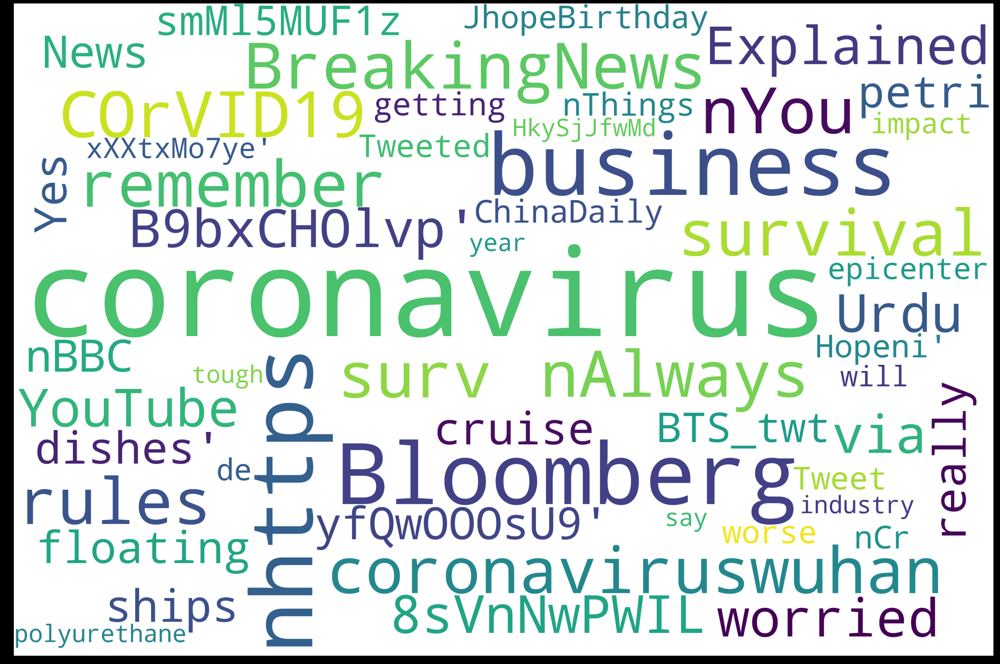

In [249]:
text = LDA0.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

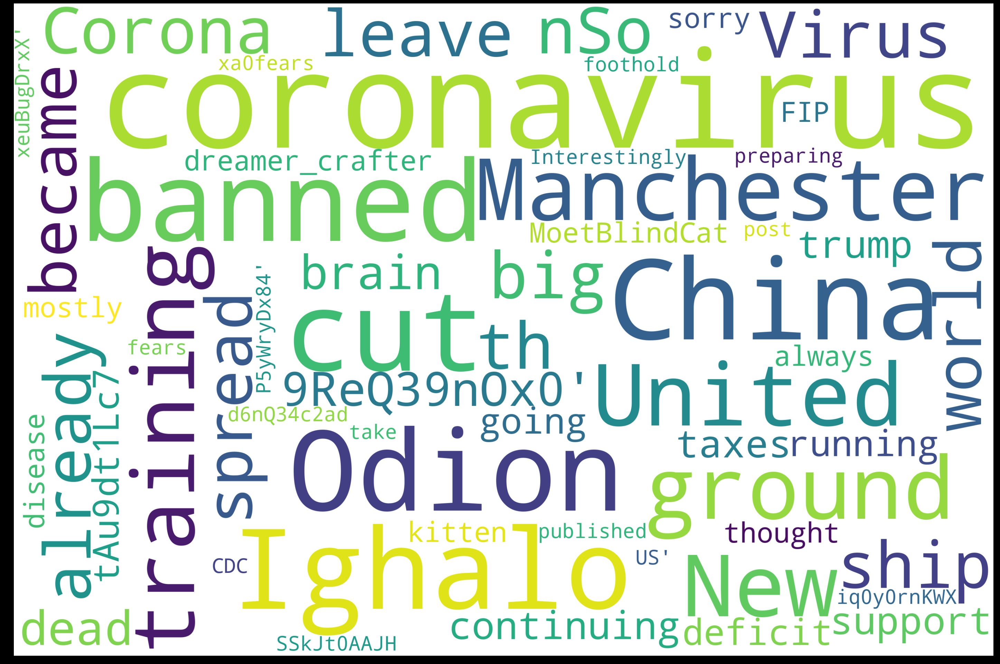

In [250]:
text = LDA1.tweet.values
stop_words = ["https", "co", "RT", "say"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

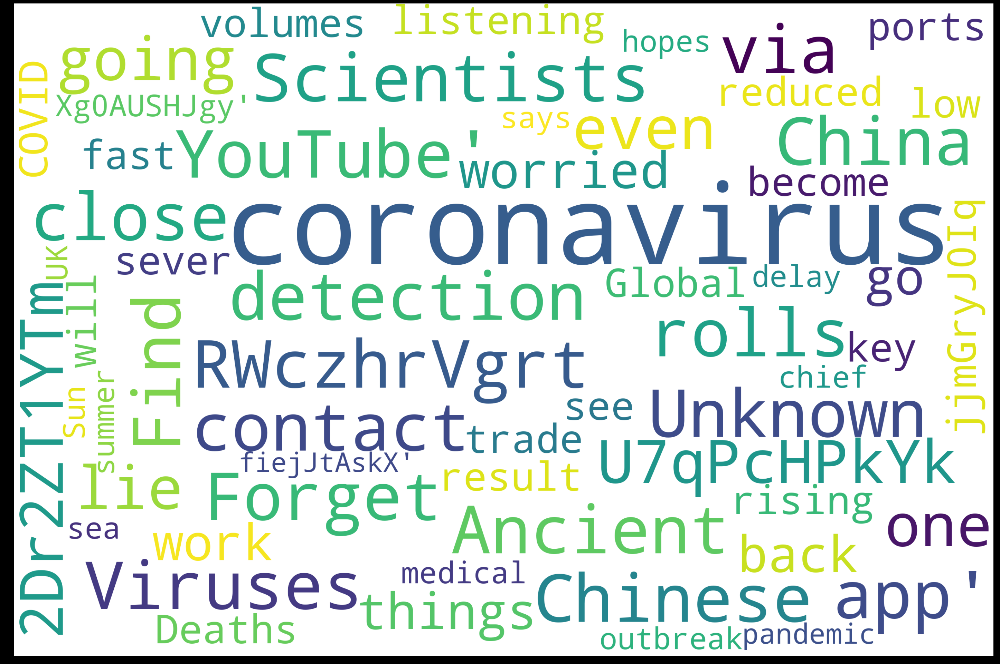

In [251]:
text = LDA2.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

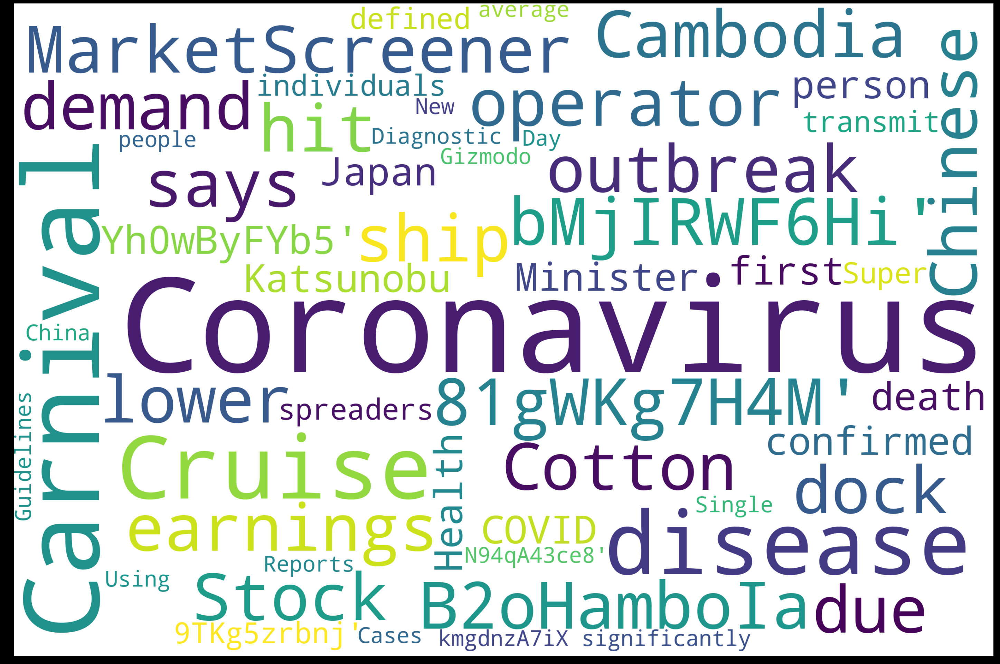

In [252]:
text = LDA3.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

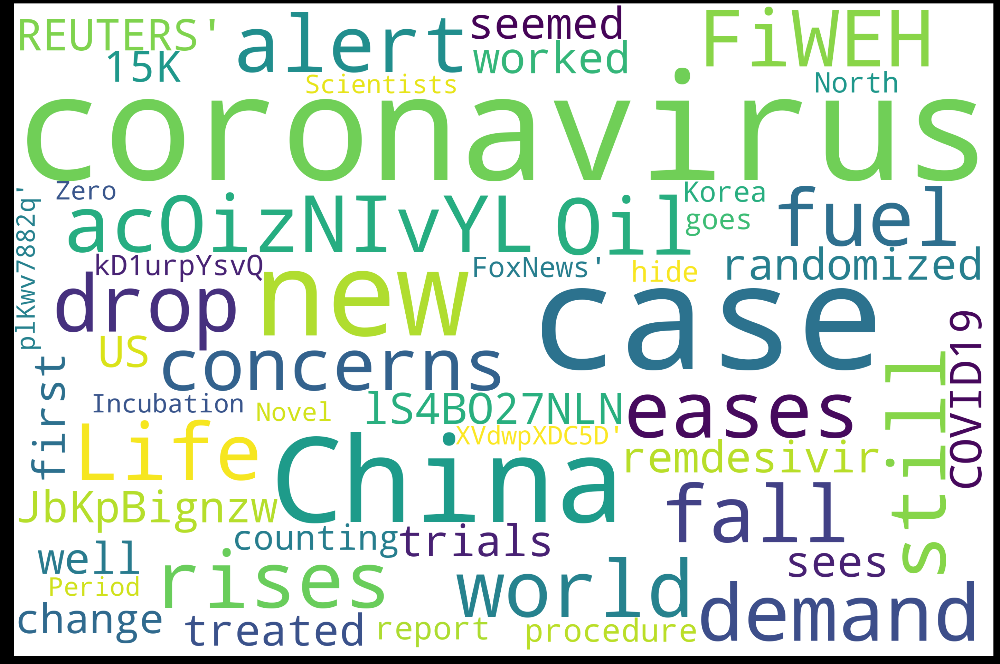

In [253]:
text = LDA4.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

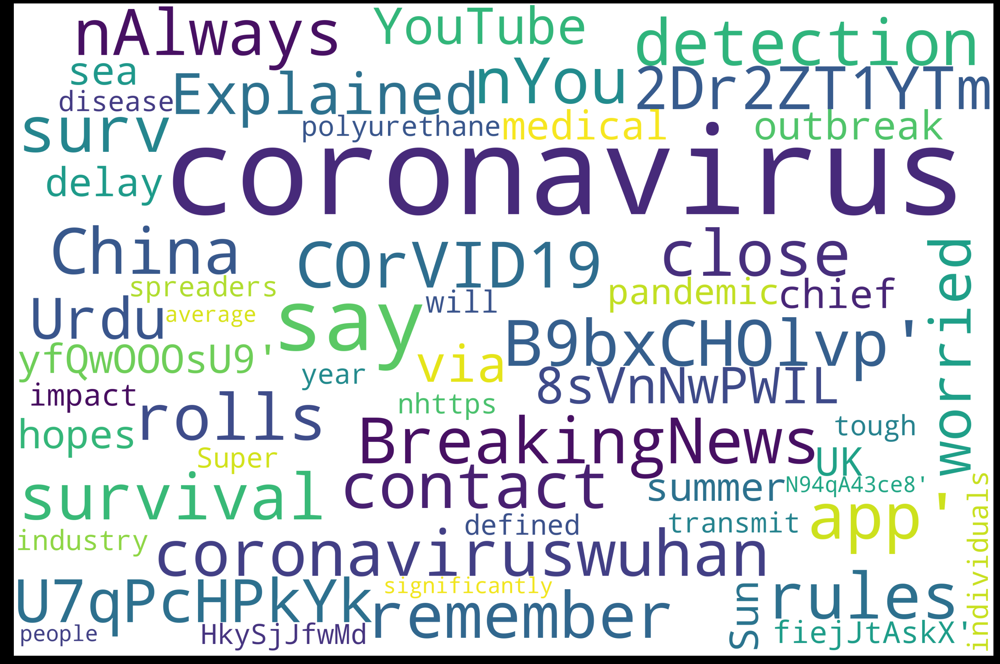

In [254]:
text = NMF0.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

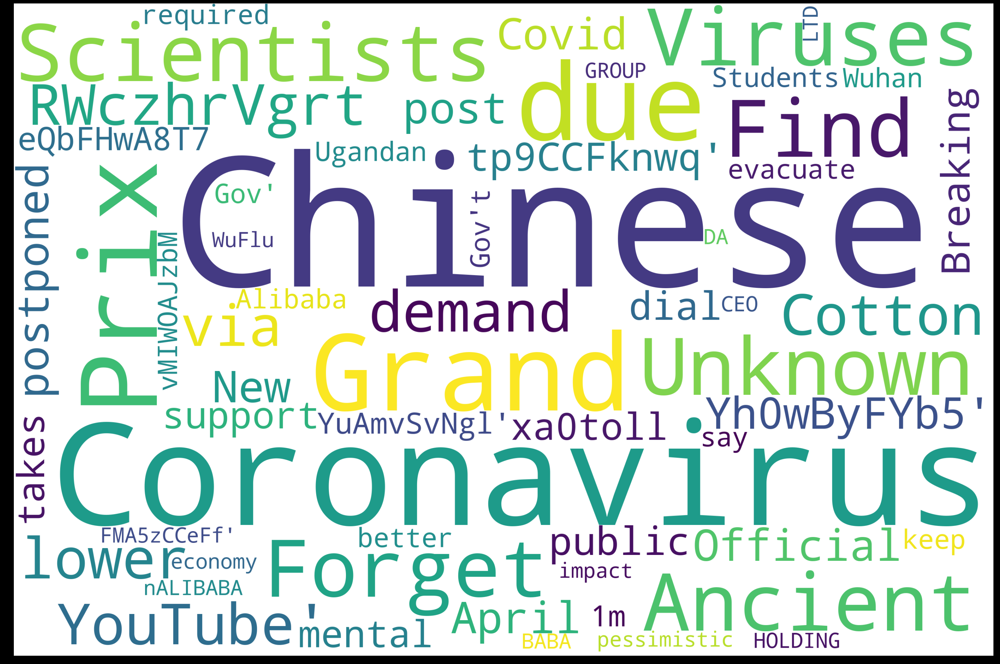

In [255]:
text = NMF1.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

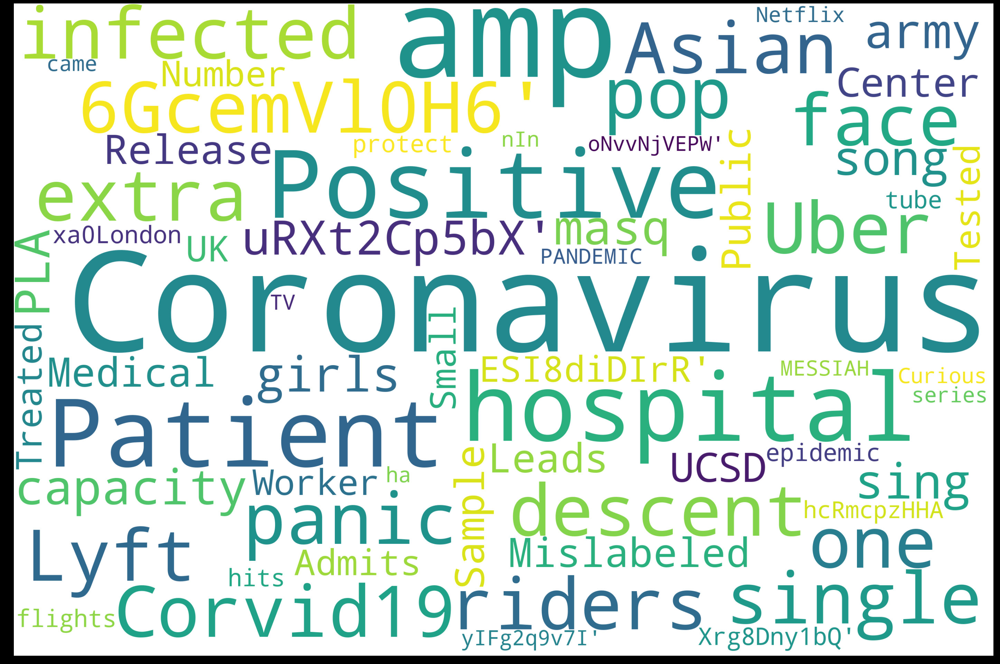

In [256]:
text = NMF2.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

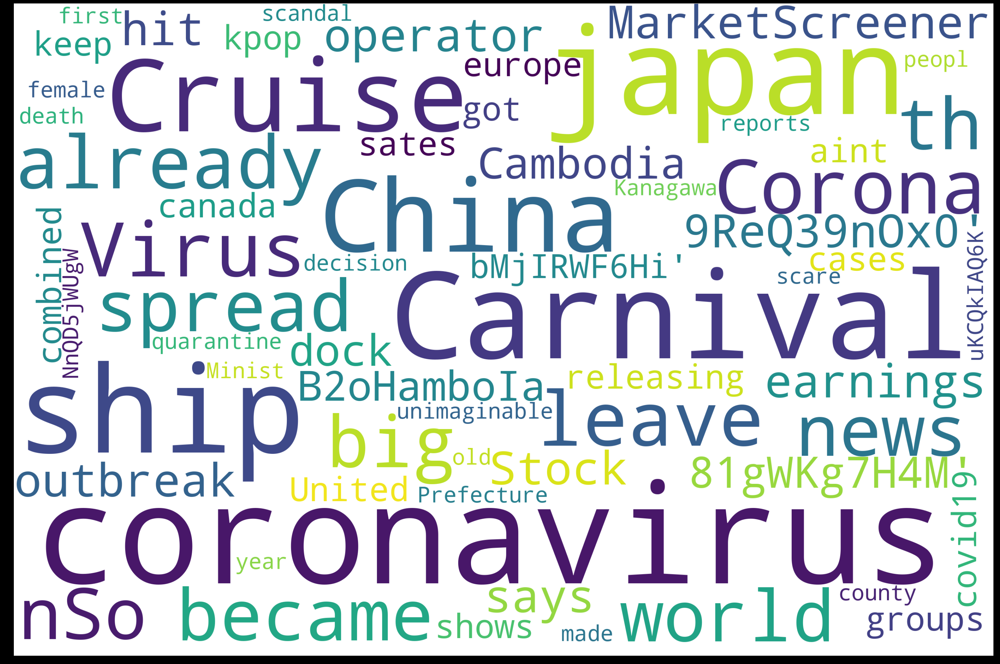

In [257]:
text = NMF3.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

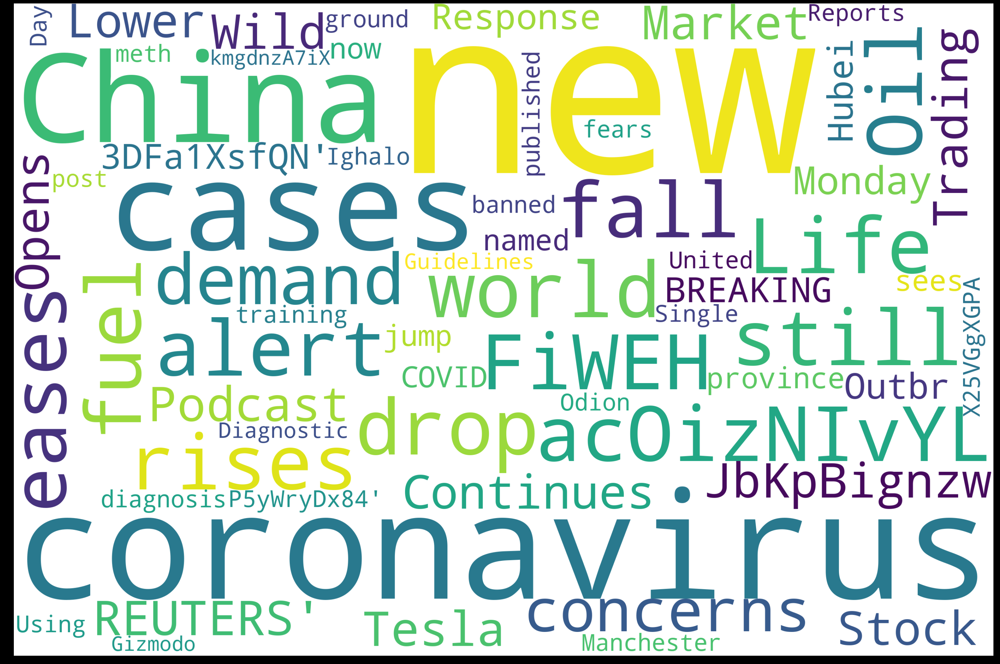

In [258]:
text = NMF4.tweet.values
stop_words = ["https", "co", "RT"] + list(STOPWORDS)
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [259]:
full_data.to_csv('coronatopics.csv')

Optimizations:

We'll want to pull actual user objects - these locations are too inconsistant.